# **Bordeless Table Detection and Extraction From Scanned Image**

# Step 1 : **Bordeless Table Detection**

**Installing required dependencies for detection**


In [1]:
# Installing ultralyicsolus in system
!pip install pytesseract transformers ultralyticsplus==0.0.23 ultralytics==8.0.21

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 466.1/466.1 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 83.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 74.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 7.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.4/148.4 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

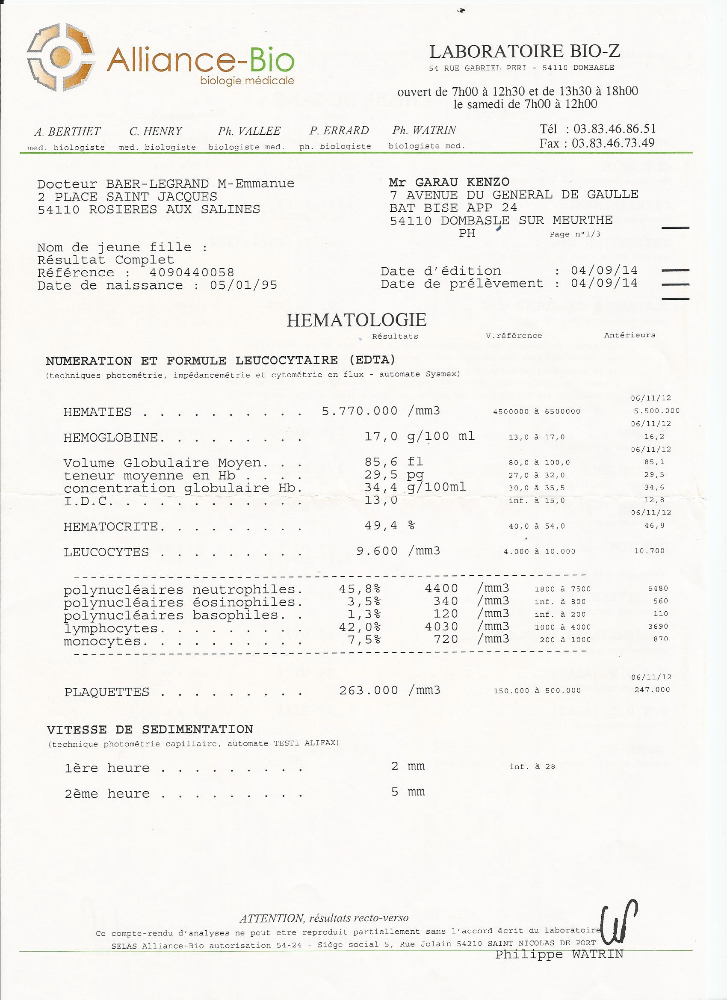

In [1]:
import numpy as np
import pandas as pd
import cv2
# import pytesseract
# from pytesseract import Output
from ultralyticsplus import YOLO, render_result
from PIL import Image #pillow

anaylise = cv2.imread("anaylise1.jpg")  #RGB
anaylise1 = Image.fromarray(anaylise)

anaylise1

Ultralytics YOLOv8.0.21 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU
Model summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs
0: 640x480 2 borderlesss, 1966.1ms
Speed: 1.2ms pre-process, 1966.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


Boxes:  tensor([[1.45000e+02, 7.75000e+02, 1.59400e+03, 1.97700e+03, 6.55325e-01, 1.00000e+00],
        [5.80000e+01, 5.00000e+00, 1.61500e+03, 3.48000e+02, 3.13826e-01, 1.00000e+00]])


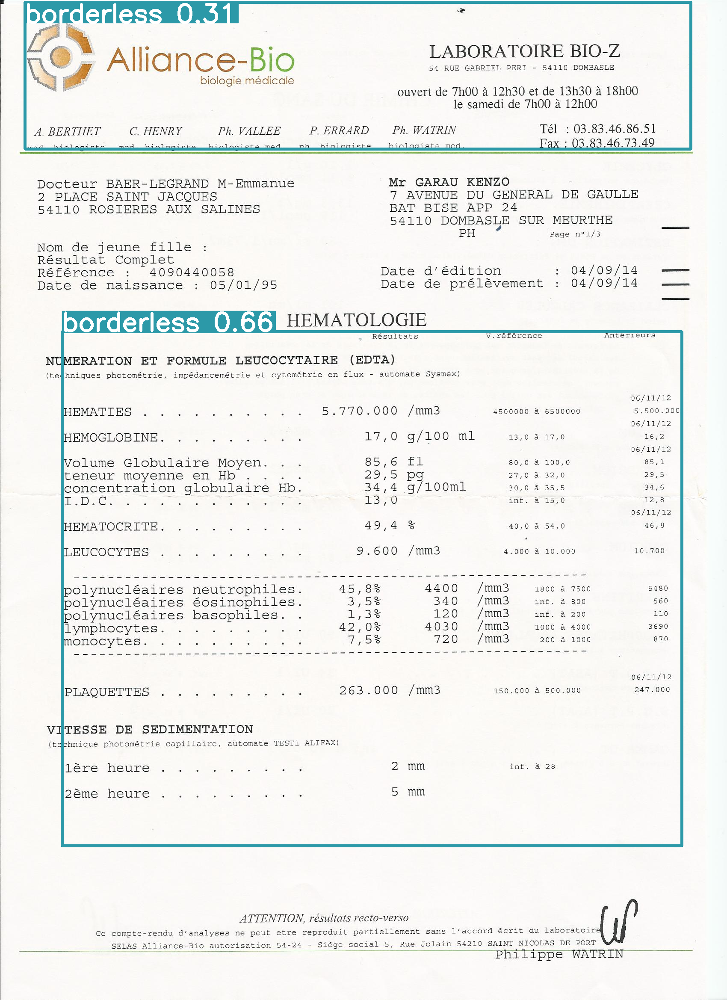

In [2]:
# load model
model = YOLO('keremberke/yolov8m-table-extraction')

# set model parameters
model.overrides['conf'] = 0.25  # NMS confidence threshold
model.overrides['iou'] = 0.45  # NMS IoU threshold
model.overrides['agnostic_nms'] = False  # NMS class-agnostic
model.overrides['max_det'] = 1000  # maximum number of detections per image

# perform inference
results = model.predict(anaylise1)

# observe results
print('Boxes: ', results[0].boxes)
render = render_result(model=model, image=anaylise1, result=results[0])
# render.save("table_detected.png")
render

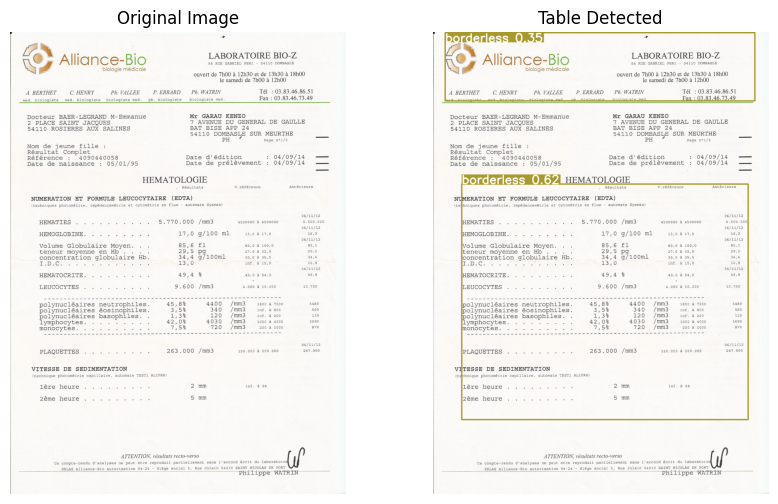

In [ ]:
import matplotlib.pyplot as plt
import cv2
"""
  The code below is for visualization purposes only.
"""
img_org = cv2.imread("anaylise1.jpg")
img_dete = cv2.imread("table_detected.png")

fig = plt.figure(figsize=(10,6))
(ax1,ax2) = fig.subplots(1,2)
ax1.imshow(img_org)
ax2.imshow(img_dete)
ax1.set_title("Original Image")
ax2.set_title("Table Detected")
ax1.axis("off")
ax2.axis("off")
fig.savefig("det_table.png")

(1202, 1449, 3)


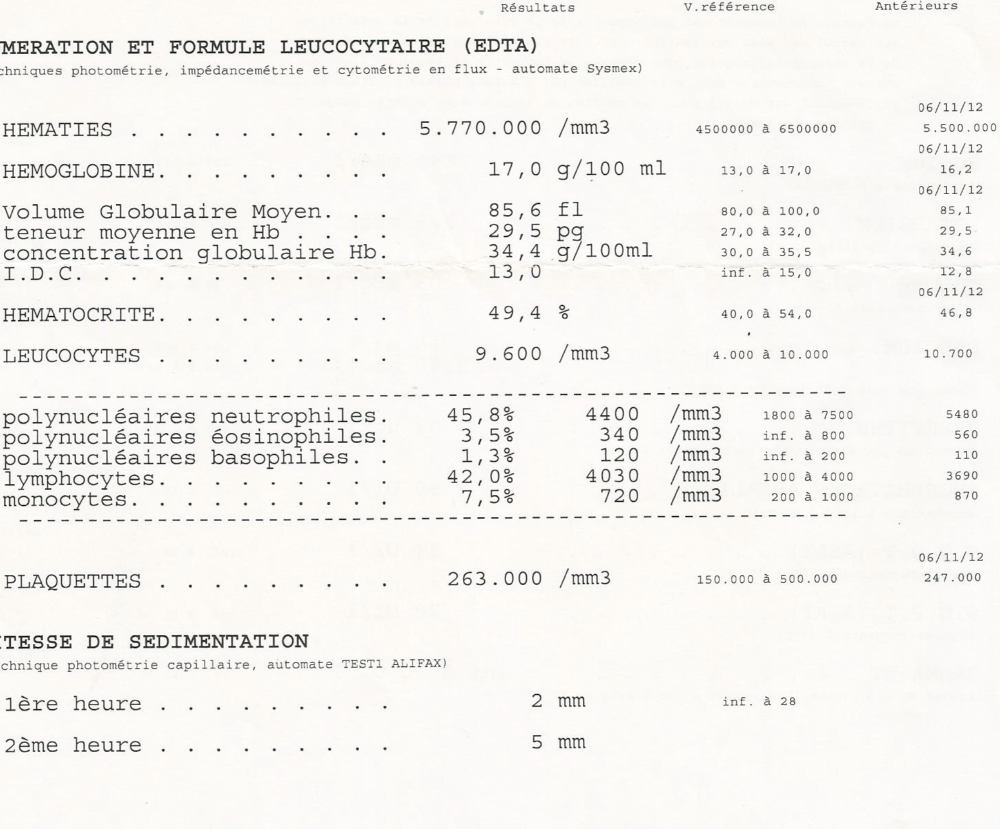

In [3]:
def RIO_select(img):
    x1, y1, x2, y2, _, _ = tuple(int(item) for item in results[0].boxes.data.numpy()[0]) # (96, 586, 947, 1286)
    # x2+=20
    # y2-=560
    # x1-=20
    # y1+=360
    # normal
    # x2+=10
    # y2-=310
    # x1-=10
    # y1+=170
    #cropping
    cropped_image = img[y1:y2, x1:x2]
    print(cropped_image.shape)
    return cropped_image

tables = RIO_select(anaylise)
Image.fromarray(tables)

In [ ]:
img = Image.fromarray(tables)
img.save("RIO.png")

# Step 2 : **Bordeless Table recognition**

# Image Preprpcessing



In [4]:
import cv2
import numpy as np
import csv

def add_10_percent_padding(img):
    image_height = img.shape[0]
    padding = int(image_height * 0.1)
    padded_img = cv2.copyMakeBorder(img, padding, padding, padding, padding, cv2.BORDER_CONSTANT, value=[255, 255, 255])
    return padded_img
def generate_csv_file(input_table):
    with open("final_result.csv", 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        for row in input_table:
            csv_writer.writerow(row)

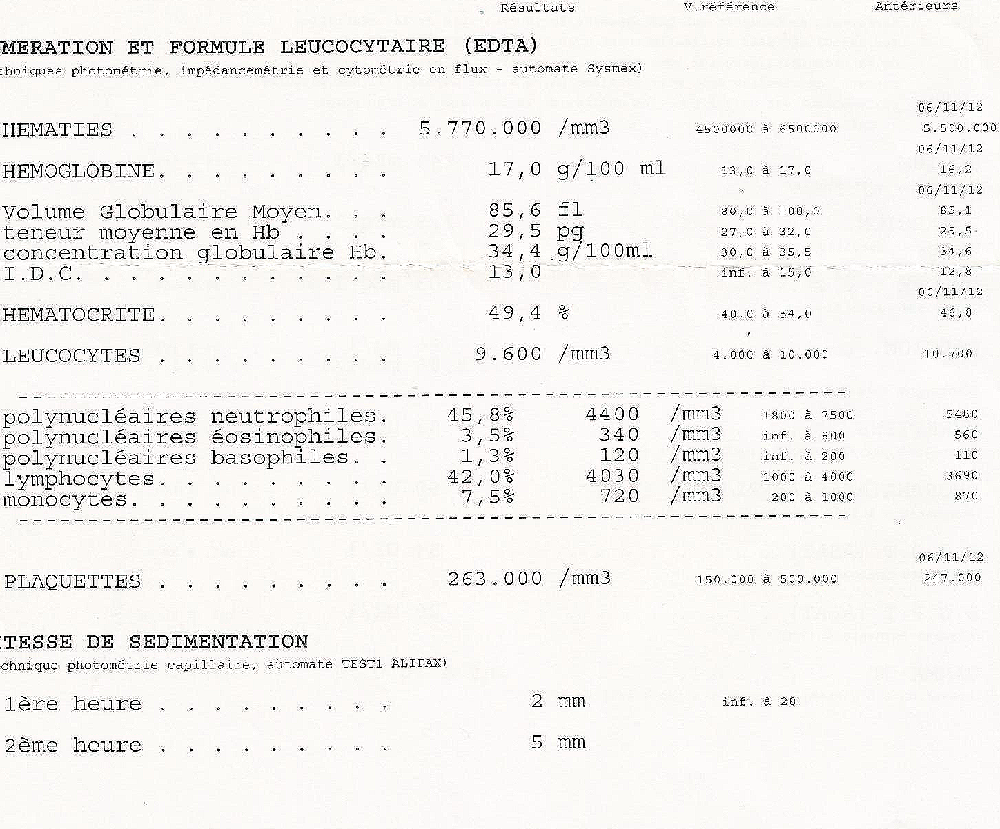

In [8]:
# increse quality
'''
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Sharpen the image
sharpened_image = cv2.filter2D(tables, -1, kernel)

# Stacking the original image with the enhanced image
im_show = Image.fromarray(sharpened_image)
im_show
'''

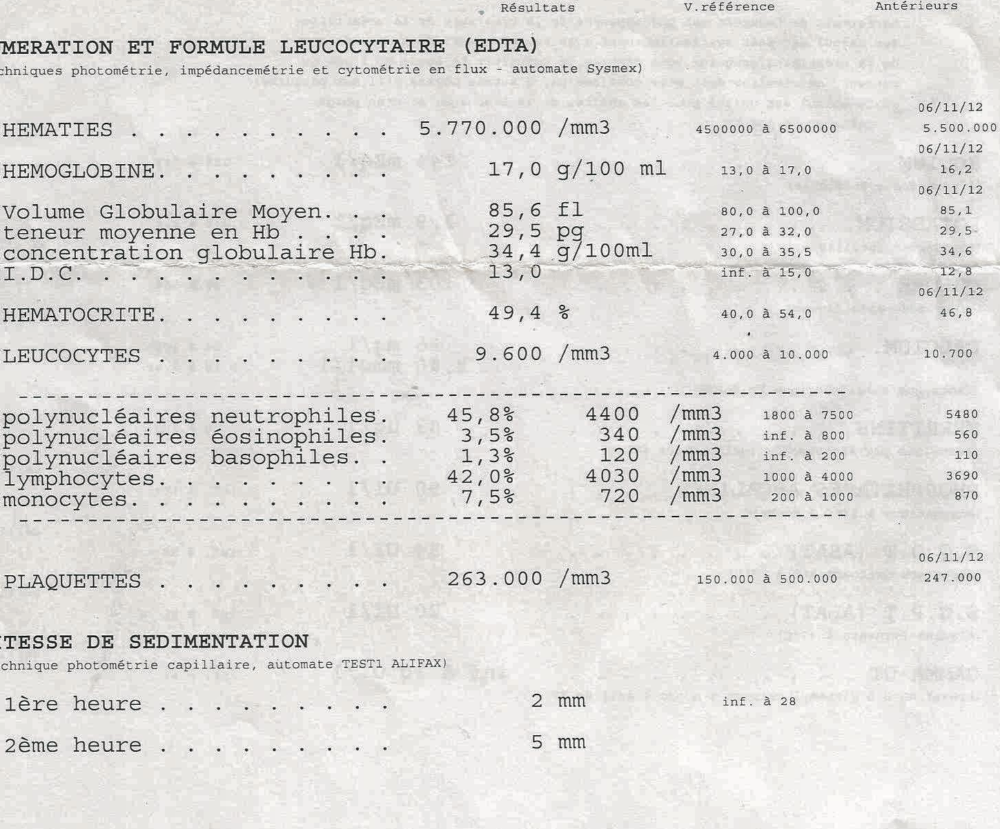

In [9]:
# contrast
'''
# converting to LAB color space
img = tables[0]
def contrast_img(img):
  lab= cv2.cvtColor(tables, cv2.COLOR_BGR2LAB)
  l_channel, a, b = cv2.split(lab)

  # Applying CLAHE to L-channel
  # feel free to try different values for the limit and grid size:
  clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(5,5))
  cl = clahe.apply(l_channel)

  # merge the CLAHE enhanced L-channel with the a and b channel
  limg = cv2.merge((cl,a,b))

  # Converting image from LAB Color model to BGR color spcae
  enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

  return enhanced_img

# Stacking the original image with the enhanced image
im_show = Image.fromarray(contrast_img(sharpened_image))
im_show
'''

# Extact Text from detected table


**Installing required dependencies for recogniton**


In [5]:
!pip install paddlepaddle
!pip install paddleocr
!wget http://nz2.archive.ubuntu.com/ubuntu/pool/main/o/openssl/libssl1.1_1.1.1f-1ubuntu2.19_amd64.deb
!sudo dpkg -i libssl1.1_1.1.1f-1ubuntu2.19_amd64.deb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.9/124.9 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.2/383.2 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.8 MB/s eta 0:00:00


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:15<00:00, 252kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:11<00:00, 920kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:04<00:00, 534kiB/s]

[2023/09/13 13:24:49] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

[2023/09/13 13:24:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/09/13 13:24:51] ppocr DEBUG: dt_boxes num : 83, elapse : 1.059324026107788
[2023/09/13 13:25:17] ppocr DEBUG: rec_res num  : 83, elapse : 25.455660820007324


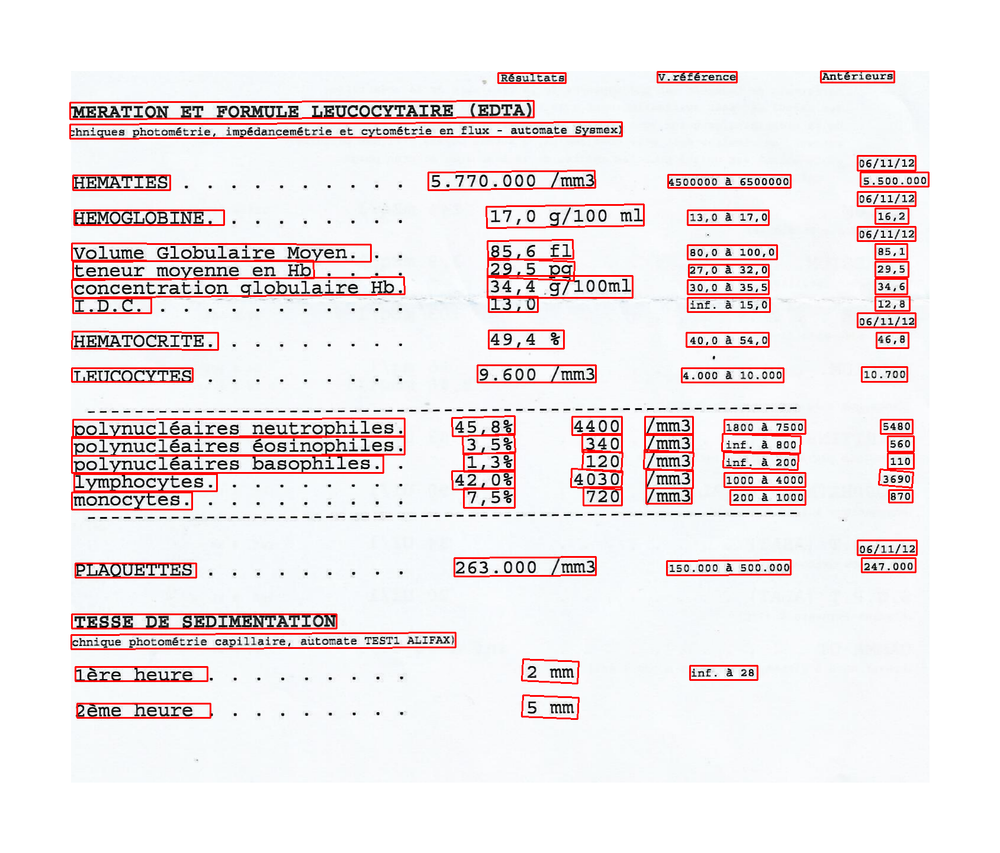

In [6]:
from paddleocr import PaddleOCR,draw_ocr

# the parameter `lang` as `ch`, `en`, `french`, `german`, `korean`, `japan`

ocr = PaddleOCR(lang='en')

image_with_padding = add_10_percent_padding(tables)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
# simple_kernel = np.ones((5,5), np.uint8)
erode_img = cv2.erode(image_with_padding,kernel)

processed_img = cv2.cvtColor(erode_img, cv2.COLOR_BGR2RGB)


result_ = ocr.ocr(processed_img)

# draw result
from PIL import Image
result_extracted = result_[0]
bounding_boxes = [line[0] for line in result_extracted]
text_extracted = [row[1][0] for row in result_extracted]
image = Image.fromarray(processed_img)
im_show = draw_ocr(image, bounding_boxes)
im_show = Image.fromarray(im_show)
im_show

In [7]:
import pandas as pd
import re

EDTA_list=[]
stack=[]
table=[]

# Extract EDAT
for ele in text_extracted:
  EDTA = re.findall(r'^[a-zA-Z. é]+$',ele,flags=re.IGNORECASE)
  if (len(EDTA) != 0):
      EDTA_list.append(EDTA[0])

# Edit text extracted
cleane_table = text_extracted.copy()
for i,ele in enumerate(text_extracted):
    if ele == '/mm3' or ele == 'mm3' :
       if text_extracted[i-1] in EDTA_list:
          ele = text_extracted[i-2]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-2]
       else:
          ele = text_extracted[i-1]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-1]

cleaned_data = [i for n, i in enumerate(cleane_table) if i not in cleane_table[:n]]
cleaned_data.remove('/mm3')
# cleaned_data.remove('mm3') if

# Creat table To generate CSV file
for ele in cleaned_data:
  ele = ele.replace('g7', 'g/')
  ele = ele.replace('f1', 'fl')
  if ele in EDTA_list[1:]:
    table.append(stack)
    stack=[]
  if ele == EDTA_list[-1]:
    table.append(stack)
  stack.append(ele.strip('.'))

# Edit table
# add header
header = ['EDTA','Resultats','V.reference','Anterieurs','Date']
table.insert(0,header)

#*****
table[13].insert(1,table[12][-1])
del table[12][-2:]

#****
table[-1].insert(1,table[-2][-1])
table[-2].remove(table[-2][-1])


table

[['EDTA', 'Resultats', 'V.reference', 'Anterieurs', 'Date'],
 ['Resultats'],
 ['V.reference'],
 ['Anterieurs',
  'MERATION ET FORMULE LEUCOCYTAIRE EDTA)',
  'hniques photometrie, impedancemetrie et cytometrie en flux- automate Sysmex)',
  '06/11/12'],
 ['HEMATIES', '5.770.000/mm3', '4500000 a 6500000', '5.500.000'],
 ['HEMOGLOBINE', '17,0 g/100 ml', '13,0a17,0', '16,2'],
 ['Volume Globulaire Moyen', '85,6fl', '800a100,0', '85,1'],
 ['teneur moyenne en Hb', '29,5 pg', '270a32,0', '29,5'],
 ['concentration globulaire Hb', '34,4.g/100ml', '30,0a35,5', '34,6'],
 ['I.D.C', '13,0', 'inf.a150', '12,8'],
 ['HEMATOCRITE', '49,4%', '40,0a540', '46,8'],
 ['LEUCOCYTES', '9.600/mm3', '4.000a10.000', '10.700'],
 ['polynucleaires neutrophiles', '45,8%', '4400/mm3'],
 ['polynucleaires eosinophiles',
  '5480',
  '3,5%',
  '340/mm3',
  'inf.a 800',
  '560',
  '1,3%',
  '120/mm3'],
 ['polynucleaires basophiles', 'inf.a200', '110'],
 ['lymphocytes', '42,0%', '4030/mm3', '1000 a 4000', '3690'],
 ['monocyte

# Save Data in CSV file

In [10]:
generate_csv_file(table)

# **Final Result**

In [11]:
import pandas as pd

data_receved = pd.read_csv("final_result.csv", error_bad_lines=False)
data_receved

Skipping line 14: expected 5 fields, saw 8



,EDTA,Resultats,V.reference,Anterieurs,Date
0,Resultats,NaN,NaN,NaN,NaN
1,V.reference,NaN,NaN,NaN,NaN
2,Anterieurs,MERATION ET FORMULE LEUCOCYTAIRE EDTA),"hniques photometrie, impedancemetrie et cytome...",06/11/12,NaN
3,HEMATIES,5.770.000/mm3,4500000 a 6500000,5.500.000,NaN
4,HEMOGLOBINE,"17,0 g/100 ml","13,0a17,0","16,2",NaN
5,Volume Globulaire Moyen,"85,6fl","800a100,0","85,1",NaN
6,teneur moyenne en Hb,"29,5 pg","270a32,0","29,5",NaN
7,concentration globulaire Hb,"34,4.g/100ml","30,0a35,5","34,6",NaN
8,I.D.C,"13,0",inf.a150,"12,8",NaN
9,HEMATOCRITE,"49,4%","40,0a540","46,8",NaN


# Data Preprocessing

**Extract EDAT**

In [12]:
import re
EDTA_list=[]
for ele in text_extracted:
  EDTA = re.findall(r'^[a-zA-Z. é]+$',ele,flags=re.IGNORECASE)
  if (len(EDTA) != 0):
      EDTA_list.append(EDTA[0])
EDTA_list

['Resultats',
 'V.reference',
 'Anterieurs',
 'HEMATIES',
 'HEMOGLOBINE.',
 'Volume Globulaire Moyen.',
 'teneur moyenne en Hb',
 'concentration globulaire Hb.',
 'I.D.C.',
 'HEMATOCRITE.',
 'LEUCOCYTES',
 'polynucleaires neutrophiles.',
 'polynucleaires eosinophiles.',
 'polynucleaires basophiles.',
 'lymphocytes.',
 'monocytes.',
 'PLAQUETTES',
 'TESSE DE SEDIMENTATION',
 'lere heure']

**Creat table To generate CSV file**

In [13]:
stack=[]
table=[]
for ele in cleaned_data:
  ele = ele.replace('g7', 'g/')
  ele = ele.replace('f1', 'fl')
  if ele in EDTA_list[1:]:
    table.append(stack)
    stack=[]
  if ele == EDTA_list[-1]:
    table.append(stack)
  stack.append(ele.strip('.'))
table

[['Resultats'],
 ['V.reference'],
 ['Anterieurs',
  'MERATION ET FORMULE LEUCOCYTAIRE EDTA)',
  'hniques photometrie, impedancemetrie et cytometrie en flux- automate Sysmex)',
  '06/11/12'],
 ['HEMATIES', '5.770.000/mm3', '4500000 a 6500000', '5.500.000'],
 ['HEMOGLOBINE', '17,0 g/100 ml', '13,0a17,0', '16,2'],
 ['Volume Globulaire Moyen', '85,6fl', '800a100,0', '85,1'],
 ['teneur moyenne en Hb', '29,5 pg', '270a32,0', '29,5'],
 ['concentration globulaire Hb', '34,4.g/100ml', '30,0a35,5', '34,6'],
 ['I.D.C', '13,0', 'inf.a150', '12,8'],
 ['HEMATOCRITE', '49,4%', '40,0a540', '46,8'],
 ['LEUCOCYTES', '9.600/mm3', '4.000a10.000', '10.700'],
 ['polynucleaires neutrophiles', '45,8%', '4400/mm3', '1800a7500', '5480'],
 ['polynucleaires eosinophiles',
  '3,5%',
  '340/mm3',
  'inf.a 800',
  '560',
  '1,3%',
  '120/mm3'],
 ['polynucleaires basophiles', 'inf.a200', '110'],
 ['lymphocytes', '42,0%', '4030/mm3', '1000 a 4000', '3690'],
 ['monocytes', '7,5%', '720/mm3', '200a1000', '870'],
 ['PLAQ

In [15]:
header = ['EDTA','Resultats','V.reference','Anterieurs','Date']
table.insert(0,header)
table[13].insert(1,table[12][-1])
del table[12][-2:]

table

[['EDTA', 'Resultats', 'V.reference', 'Anterieurs', 'Date'],
 ['Resultats'],
 ['V.reference'],
 ['Anterieurs',
  'MERATION ET FORMULE LEUCOCYTAIRE EDTA)',
  'hniques photometrie, impedancemetrie et cytometrie en flux- automate Sysmex)',
  '06/11/12'],
 ['HEMATIES', '5.770.000/mm3', '4500000 a 6500000', '5.500.000'],
 ['HEMOGLOBINE', '17,0 g/100 ml', '13,0a17,0', '16,2'],
 ['Volume Globulaire Moyen', '85,6fl', '800a100,0', '85,1'],
 ['teneur moyenne en Hb', '29,5 pg', '270a32,0', '29,5'],
 ['concentration globulaire Hb', '34,4.g/100ml', '30,0a35,5', '34,6'],
 ['I.D.C', '13,0', 'inf.a150', '12,8'],
 ['HEMATOCRITE', '49,4%', '40,0a540', '46,8'],
 ['LEUCOCYTES', '9.600/mm3', '4.000a10.000', '10.700'],
 ['polynucleaires neutrophiles', '45,8%', '4400/mm3'],
 ['polynucleaires eosinophiles',
  '5480',
  '3,5%',
  '340/mm3',
  'inf.a 800',
  '560'],
 ['polynucleaires basophiles', '120/mm3', 'inf.a200', '110'],
 ['lymphocytes', '42,0%', '4030/mm3', '1000 a 4000', '3690'],
 ['monocytes', '7,5%', 

In [ ]:
table[-1].insert(1,table[-2][-1])
table[-2].remove(table[-2][-1])
table

[['EDTA', 'Resultats', 'V.reference', 'Anterieurs', 'Date'],
 ['HEMATIES', '5.770.000/mm3', '4500000 a 6500000', '5.500.000', '06/11/12'],
 ['HEMOGLOBINE.', '17,0g/100 ml', '13,0a17,0', '16,2', '06/11/12'],
 ['Volume Globulaire Moyen.', '85,6fl', '80,0a100,0', '85,1'],
 ['teneur moyenne en Hb', '29,5 pg', '27.0a32,0', '29,5'],
 ['concentration globulaire Hb.', '34,4.g/100ml', '30,0a35,5', '34,6'],
 ['I.D.C.', '13,0', 'inf.a15,0', '12,8', '06/11/12'],
 ['HEMATOCRITE.', '49,4%', '40,0a54,0', '46,8'],
 ['LEUCOCYTES', '9.600', '/mm3', '4.000a10.000', '10.700'],
 ['polynucleaires neutrophiles.',
  '45,8%',
  '4400',
  '/mm3',
  '1800 a7500',
  '5480'],
 ['polynucleaires eosinophiles.', '3,5%', '340', '/mm3', 'inf.a800', '560'],
 ['polynucleaires basophiles.', '1,3%', '120', '/mm3', 'inf.a200', '110'],
 ['lymphocytes..', '42,0%', '4030', '/mm3', '1000 a4000', '3690'],
 ['monocytes.', '7,5%', '720', '/mm3', '200a1000', '870', '06/11/12'],
 ['PLAOUETTES', '263.000/mm3', '150.000 a 500.000', '2

**cleaned the table**

In [ ]:
cleane_table = text_extracted.copy()
for i,ele in enumerate(text_extracted):
    if ele == '/mm3' or ele == 'mm3' :
       if text_extracted[i-1] in EDTA_list:
          ele = text_extracted[i-2]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-2]
       else:
          ele = text_extracted[i-1]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-1]

cleaned_data = [i for n, i in enumerate(cleane_table) if i not in cleane_table[:n]]
cleaned_data.remove('/mm3')
cleaned_data

['HEMATIES',
 '5.770.000/mm3',
 '4500000 a 6500000',
 '5.500.000',
 '06/11/12',
 'HEMOGLOBINE.',
 '17,0g/100 ml',
 '13,0a17,0',
 '16,2',
 'Volume Globulaire Moyen.',
 '85,6fl',
 '80,0a100,0',
 '85,1',
 'teneur moyenne en Hb',
 '29,5 pg',
 '27.0a32,0',
 '29,5',
 'concentration globulaire Hb.',
 '34,4.g/100ml',
 '30,0a35,5',
 '34,6',
 'I.D.C.',
 '13,0',
 'inf.a15,0',
 '12,8',
 'HEMATOCRITE.',
 '49,4%',
 '40,0a54,0',
 '46,8',
 'LEUCOCYTES',
 '9.600/mm3',
 '4.000a10.000',
 '10.700',
 'polynucleaires neutrophiles.',
 '45,8%',
 '4400/mm3',
 '1800 a7500',
 '5480',
 'polynucleaires eosinophiles.',
 '3,5%',
 '340/mm3',
 'inf.a800',
 '560',
 'polynucleaires basophiles.',
 '1,3%',
 '120/mm3',
 'inf.a200',
 '110',
 'lymphocytes..',
 '42,0%',
 '4030/mm3',
 '1000 a4000',
 '3690',
 '7,5%',
 'monocytes.',
 '720/mm3',
 '200a1000',
 '870',
 '263.000/mm3',
 'PLAOUETTES',
 '150.000 a 500.000',
 '247.000']

In [ ]:
cleane_table.count('/mm3')

5

In [ ]:
'34,4.g7100ml'.replace("g7","g/")


'34,4.g/100ml'

**add some padding to the boxes**

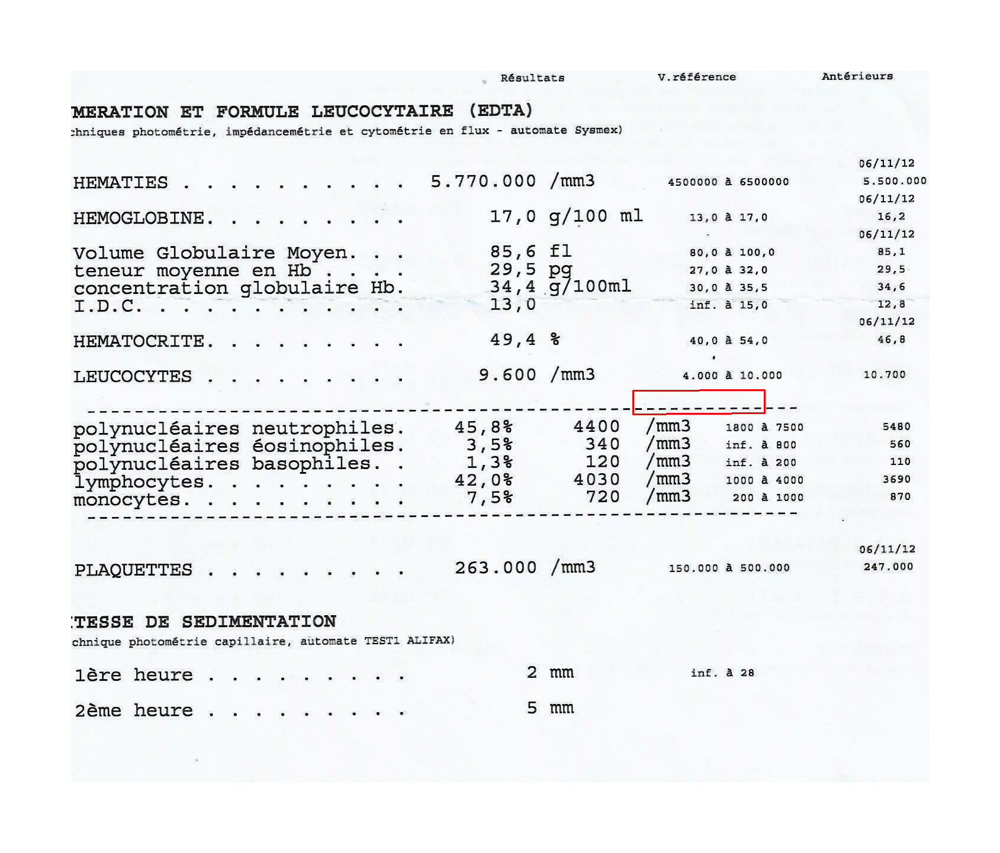

In [16]:
# x=[81.0, 79.0]
# y=[319.0, 79.0]
# w=[319.0, 102.0]
# h=[81.0, 102.0]
x,y,w,h, = [1079.0, 666.0], [1291.0, 665.0], [1291.0, 692.0], [1079.0, 694.0]
x[1]-=6
x[0]-=10
y[1]-=6
w[1]+=6
h[1]+=6
h[0]-=10

im_show = draw_ocr(image, [[ x, y,
                            w, h]])
im_show = Image.fromarray(im_show)
im_show

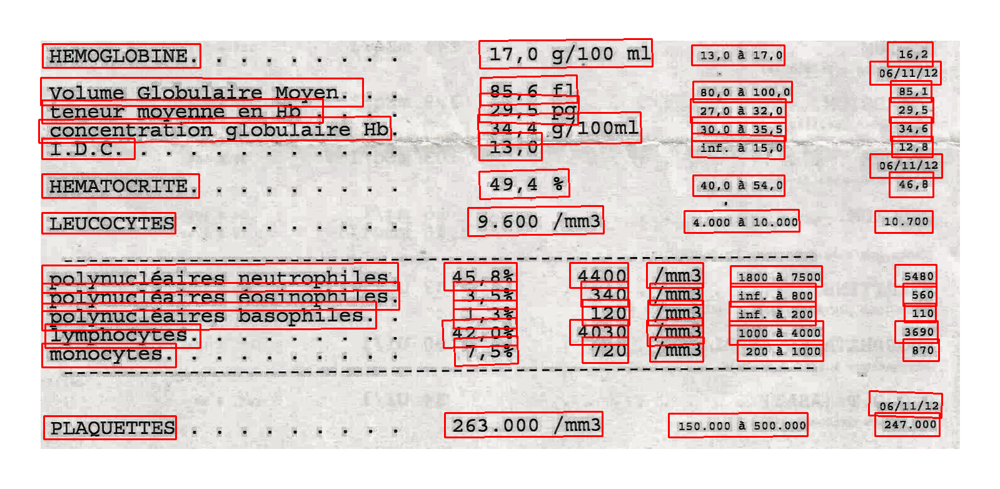

In [ ]:
for line in result_extracted:
  line[0][0][1]-=5 # x1
  line[0][0][0]-=10 # x0
  line[0][1][1]-=5 # y1
  line[0][2][1]+=5 # w1
  line[0][3][1]+=5 # w1
  line[0][3][0]-=10 # w1

from PIL import Image
result_extracted = result_[0]
bounding_boxes = [line[0] for line in result_extracted]
# text_extracted = [row[1][0] for row in result_extracted]
image = Image.fromarray(processed_img)
im_show = draw_ocr(image, bounding_boxes)
im_show = Image.fromarray(im_show)
im_show

# **Main Programme**

**Requirements**

In [ ]:
!pip install paddlepaddle
!pip install paddleocr
!wget http://nz2.archive.ubuntu.com/ubuntu/pool/main/o/openssl/libssl1.1_1.1.1f-1ubuntu2.19_amd64.deb
!sudo dpkg -i libssl1.1_1.1.1f-1ubuntu2.19_amd64.deb
!pip install pytesseract transformers ultralyticsplus==0.0.23 ultralytics==8.0.21

In [19]:
import numpy as np
import pandas as pd
import re
import cv2
import csv
from ultralyticsplus import YOLO, render_result
from paddleocr import PaddleOCR,draw_ocr
from PIL import Image #pillow

anaylise = cv2.imread("anaylise1.jpg")  #RGB
anaylise1 = Image.fromarray(anaylise)

# load model
model = YOLO('keremberke/yolov8m-table-extraction')

# set model parameters
model.overrides['conf'] = 0.25  # NMS confidence threshold
model.overrides['iou'] = 0.45  # NMS IoU threshold
model.overrides['agnostic_nms'] = False  # NMS class-agnostic
model.overrides['max_det'] = 1000  # maximum number of detections per image

# perform inference
results = model.predict(anaylise1)

# select RIO
# img = np.array(Image.open(anaylise))

def RIO_select(img):
    x1, y1, x2, y2, _, _ = tuple(int(item) for item in results[0].boxes.data.numpy()[0]) # (96, 586, 947, 1286)
    # x2+=10
    # y2-=310
    # x1-=10
    # y1+=170
    #cropping
    cropped_image = img[y1:y2, x1:x2]
    print(cropped_image.shape)
    return cropped_image

tables = RIO_select(anaylise)

def add_10_percent_padding(img):
    image_height = img.shape[0]
    padding = int(image_height * 0.1)
    padded_img = cv2.copyMakeBorder(img, padding, padding, padding, padding, cv2.BORDER_CONSTANT, value=[255, 255, 255])
    return padded_img
def generate_csv_file(input_table):
    with open("final_result.csv", 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        for row in input_table:
            csv_writer.writerow(row)

# ocr for text extraction
ocr = PaddleOCR(lang='en')
# Image preprocessing
image_with_padding = add_10_percent_padding(tables)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
erode_img = cv2.erode(image_with_padding,kernel)
processed_img = cv2.cvtColor(erode_img, cv2.COLOR_BGR2RGB)

result_ = ocr.ocr(processed_img)

# select text extracted
result_extracted = result_[0]
text_extracted = [row[1][0] for row in result_extracted]

EDTA_list=[]
stack=[]
table=[]

# Extract EDAT
for ele in text_extracted:
  EDTA = re.findall(r'^[a-zA-Z. é]+$',ele,flags=re.IGNORECASE)
  if (len(EDTA) != 0):
      EDTA_list.append(EDTA[0])

# Edit text extracted
cleane_table = text_extracted.copy()
for i,ele in enumerate(text_extracted):
    if ele == '/mm3' or ele == 'mm3' :
       if text_extracted[i-1] in EDTA_list:
          ele = text_extracted[i-2]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-2]
       else:
          ele = text_extracted[i-1]+ele
          cleane_table.insert(i,ele)
          del cleane_table[i-1]

cleaned_data = [i for n, i in enumerate(cleane_table) if i not in cleane_table[:n]]
cleaned_data.remove('/mm3')

# Creat table To generate CSV file
for ele in cleaned_data:
  ele = ele.replace('g7', 'g/')
  ele = ele.replace('f1', 'fl')
  if ele in EDTA_list[1:]:
    table.append(stack)
    stack=[]
  if ele == EDTA_list[-1]:
    table.append(stack)
  stack.append(ele.strip('.'))

# Edit table
# add header
header = ['EDTA','Resultats','V.reference','Anterieurs','Date']
table.insert(0,header)

#*****
table[13].insert(1,table[12][-1])
del table[12][-2:]

#****
table[-1].insert(1,table[-2][-1])
table[-2].remove(table[-2][-1])

# save data in CSV file
generate_csv_file(table)


Ultralytics YOLOv8.0.21 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU
Model summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs
0: 640x480 2 borderlesss, 1945.0ms
Speed: 1.2ms pre-process, 1945.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


(1202, 1449, 3)
[2023/09/13 13:30:31] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_

# **Read Final Result**

In [20]:
data_receved = pd.read_csv("final_result.csv", error_bad_lines=False)
data_receved

Skipping line 14: expected 5 fields, saw 8



,EDTA,Resultats,V.reference,Anterieurs,Date
0,Resultats,NaN,NaN,NaN,NaN
1,V.reference,NaN,NaN,NaN,NaN
2,Anterieurs,MERATION ET FORMULE LEUCOCYTAIRE EDTA),"hniques photometrie, impedancemetrie et cytome...",06/11/12,NaN
3,HEMATIES,5.770.000/mm3,4500000 a 6500000,5.500.000,NaN
4,HEMOGLOBINE,"17,0 g/100 ml","13,0a17,0","16,2",NaN
5,Volume Globulaire Moyen,"85,6fl","800a100,0","85,1",NaN
6,teneur moyenne en Hb,"29,5 pg","270a32,0","29,5",NaN
7,concentration globulaire Hb,"34,4.g/100ml","30,0a35,5","34,6",NaN
8,I.D.C,"13,0",inf.a150,"12,8",NaN
9,HEMATOCRITE,"49,4%","40,0a540","46,8",NaN
